In [1]:
using Pkg
Pkg.activate("../../Project.toml")

include("../../LogLoss/RealRealHighDimension.jl")
include("../ForecastingMainNew.jl");
using JLD2
using DataFrames

  Activating project at `~/Documents/QML Project/QuantumInspiredML`


# ECG200

In [5]:
dloc =  "../paper/ecg200/mps_saves/legendre_d8_chi35.jld2"
f = jldopen(dloc, "r")
    X_train_scaled2 = read(f, "X_train_scaled")
    y_train2 = read(f, "y_train")
    X_test_scaled2 = read(f, "X_test_scaled")
    y_test2 = read(f, "y_test");
close(f)

dloc =  "../paper/ecg200/datasets/ecg200.jld2"
f = jldopen(dloc, "r")

X_train = read(f, "X_train")
y_train = read(f, "y_train")
X_test = read(f, "X_test")
y_test = read(f, "y_test")

close(f)


This is the current hacky workaround due to the issue with the new opts (which contains an anonymous function for the encoding in the opts struct not being serialized properly). Just load everything else from the JLD2 and reconstruct the opts locally.

In [6]:

# (X_train, y_train), (X_val, y_val), (X_test, y_test) = load_splits_txt("../LogLoss/datasets/ECG_train.txt", 
# "../LogLoss/datasets/ECG_val.txt", "../LogLoss/datasets/ECG_test.txt")

# X_train = vcat(X_val, X_train)
# y_train = vcat(y_val, y_train);

In [8]:
setprecision(BigFloat, 128)
Rdtype = Float64

verbosity = 0
test_run = false
track_cost = false

encoding = legendre(norm=false)
encode_classes_separately = false
train_classes_separately = encode_classes_separately

#encoding = Basis("Legendre")
dtype = encoding.iscomplex ? ComplexF64 : Float64

opts=Options(; nsweeps=20, chi_max=35, update_iters=1, verbosity=verbosity, dtype=dtype, loss_grad=loss_grad_KLD,
bbopt=BBOpt("CustomGD"), track_cost=track_cost, eta=0.0025, rescale = (false, true), d=8, aux_basis_dim=2, encoding=encoding, 
encode_classes_separately=encode_classes_separately, train_classes_separately=train_classes_separately, exit_early=false)


# W, info, train_states, test_states = fitMPS(X_train, y_train,X_test, y_test; random_state=456, chi_init=4, opts=opts, test_run=false);


Options
  nsweeps: Int64 20
  chi_max: Int64 35
  cutoff: Float64 1.0e-10
  update_iters: Int64 1
  verbosity: Int64 0
  dtype: Float64 <: AbstractFloat
  loss_grad: loss_grad_KLD (function of type typeof(loss_grad_KLD))
  bbopt: BBOpt
  track_cost: Bool false
  eta: Float64 0.0025
  rescale: Tuple{Bool, Bool}
  d: Int64 8
  aux_basis_dim: Int64 2
  encoding: Basis
  train_classes_separately: Bool false
  encode_classes_separately: Bool false
  return_encoding_meta_info: Bool false
  minmax: Bool true
  exit_early: Bool false


In [9]:
svpath = "../paper/ecg200/mps_saves/legendreNN2_d8_chi35.jld2"
# f = jldopen(svpath, "w")
#     write(f, "X_train_scaled", X_train_scaled)
#     write(f, "y_train", y_train)
#     write(f, "X_test_scaled", X_test_scaled)
#     write(f, "y_test", y_test);
#     write(f, "mps", W)
#     write(f, "opts", opts)
# close(f)


f = jldopen(svpath, "r")
X_train_scaled = read(f, "X_train_scaled")
y_train = read(f, "y_train")
X_test_scaled = read(f, "X_test_scaled")
y_test = read(f, "y_test");
mps = read(f, "mps")
opts = read(f, "opts")
close(f)


In [11]:
scaler = fit_scaler(RobustSigmoidTransform, X_train);

range = opts.encoding.range
# X_train_scaled = permutedims(transform_data(scaler, X_train; range=range, minmax_output=opts.minmax))
# X_test_scaled = permutedims(transform_data(scaler, X_test; range=range, minmax_output=opts.minmax));
X_train_scaled = transform_data(scaler, X_train; range=range, minmax_output=opts.minmax)
X_test_scaled = transform_data(scaler, X_test; range=range, minmax_output=opts.minmax);
#mps = read(f, "mps");
#opts = read(f, "opts")

@show X_train_scaled2 == X_train_scaled
@show size(X_train_scaled)

X_train_scaled2 == X_train_scaled = true
size(X_train_scaled) = (100, 96)


(100, 96)

In [13]:
fc = load_forecasting_info_variables(mps, X_train_scaled, 
    y_train, X_test_scaled, y_test, opts);

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
                         Summary:

 - Dataset has 100 training samples and 100 testing samples.
 - 2 class(es) was detected. Slicing MPS into individual states...
 - Time independent encoding - Legendre_No_Norm - detected.
 - d = 8, chi_max = 35

 Created 2 forecastable struct(s) containing class-wise mps and test samples.


# Interpolaton

╭────────┬──────────╮
│ Metric │    Value │
├────────┼──────────┤
│  SMAPE │ 0.231737 │
│    MSE │ 0.013305 │
│   MAPE │ 0.244094 │
│    MAE │ 0.095908 │
│   RMSE │ 0.013305 │
╰────────┴──────────╯
╭────────┬───────────╮
│ Metric │     Value │
├────────┼───────────┤
│  SMAPE │    0.3937 │
│    MSE │ 0.0460902 │
│   MAPE │  0.390692 │
│    MAE │  0.139099 │
│   RMSE │ 0.0460902 │
╰────────┴───────────╯


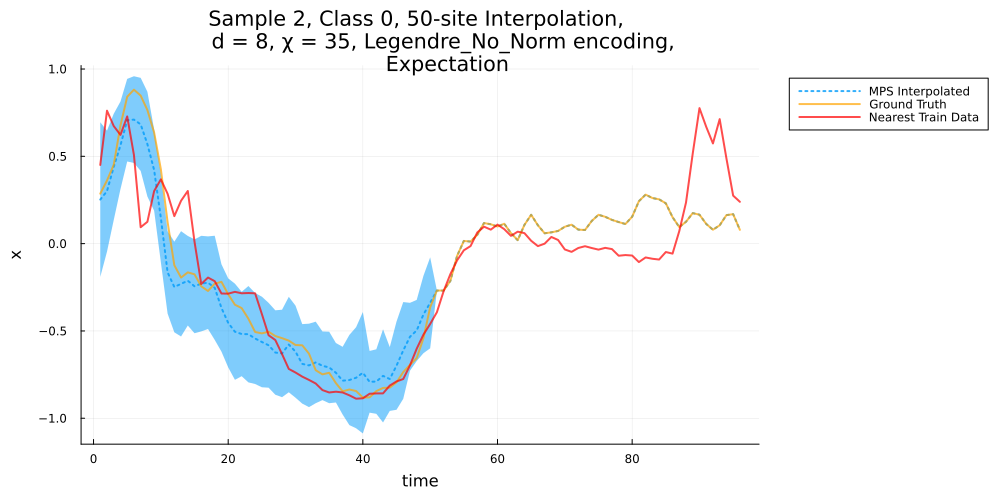

In [15]:


class = 0
interp_sites = collect(1:50)
instance_idx = 2
stats, mse_stats, p1 = any_interpolate_single_time_series(fc, class, instance_idx, interp_sites, :directMean; MSE_baseline=true, X_train_scaled=X_train_scaled, y_train=y_train);

plot(p1)

In [19]:
n1s = sum(y_test)
n0s = length(y_test) - n1s

n_each = 6


samples = [shuffle(1:n0s)[1:n_each]; shuffle(1:n1s)[1:n_each]]
classes = [zeros(Int,n_each); ones(Int,n_each)]

ps = []
stats = []
MSE_stats = []
for (i,s) in enumerate(samples)
    class = classes[i]
    interp_sites = collect(2:50)
    instance_idx = s
    stat, MSE_stat, p1 = any_interpolate_single_time_series(fc, class, instance_idx, interp_sites, :directMean; MSE_baseline=true, X_train_scaled=X_train_scaled, y_train=y_train);
    push!(ps, p1)
    push!(stats, stat)
    push!(MSE_stats, MSE_stat)
end



╭────────┬──────────╮
│ Metric │    Value │
├────────┼──────────┤
│  SMAPE │  1.32173 │
│    MSE │  0.42968 │
│   MAPE │  2.88653 │
│    MAE │ 0.567646 │
│   RMSE │  0.42968 │
╰────────┴──────────╯
╭────────┬───────────╮
│ Metric │     Value │
├────────┼───────────┤
│  SMAPE │  0.708085 │
│    MSE │ 0.0999189 │
│   MAPE │   1.57298 │
│    MAE │  0.217921 │
│   RMSE │ 0.0999189 │
╰────────┴───────────╯
╭────────┬───────────╮
│ Metric │     Value │
├────────┼───────────┤
│  SMAPE │  0.714283 │
│    MSE │ 0.0655646 │
│   MAPE │  0.884704 │
│    MAE │  0.231911 │
│   RMSE │ 0.0655646 │
╰────────┴───────────╯
╭────────┬───────────╮
│ Metric │     Value │
├────────┼───────────┤
│  SMAPE │  0.385263 │
│    MSE │ 0.0399999 │
│   MAPE │  0.829583 │
│    MAE │   0.11233 │
│   RMSE │ 0.0399999 │
╰────────┴───────────╯
╭────────┬───────────╮
│ Metric │     Value │
├────────┼───────────┤
│  SMAPE │  0.313731 │
│    MSE │ 0.0172038 │
│   MAPE │  0.981265 │
│    MAE │ 0.0929817 │
│   RMSE │ 0.0172038

In [44]:

p = plot(ps[1:6]..., size=(2000,1000), layout=(3,2))
savefig(p, "figs/c0ecg.svg")

p = plot(ps[7:12]..., size=(2000,1000), layout=(3,2))
savefig(p, "figs/c1ecg.svg")


"/home/noodles/Documents/QML Project/QuantumInspiredML/Interpolation/figs/c0ecg.svg"

"/home/noodles/Documents/QML Project/QuantumInspiredML/Interpolation/figs/c1ecg.svg"

In [35]:
n1s = sum(y_test)
n0s = length(y_test) - n1s


samples = [shuffle(1:n0s); shuffle(1:n1s)]
classes = [zeros(Int,n0s); ones(Int,n1s)]

ps = []
stats = []
MSE_stats = []
for (i,s) in enumerate(samples)
    class = classes[i]
    interp_sites = collect(2:50)
    instance_idx = s
    stat, MSE_stat, p1 = any_interpolate_single_time_series(fc, class, instance_idx, interp_sites, :directMean; MSE_baseline=true, X_train_scaled=X_train_scaled, y_train=y_train);
    push!(ps, p1)
    push!(stats, stat)
    push!(MSE_stats, MSE_stat)
end


╭────────┬──────────╮
│ Metric │    Value │
├────────┼──────────┤
│  SMAPE │ 0.797324 │
│    MSE │ 0.165682 │
│   MAPE │  2.36511 │
│    MAE │ 0.295357 │
│   RMSE │ 0.165682 │
╰────────┴──────────╯
╭────────┬──────────╮
│ Metric │    Value │
├────────┼──────────┤
│  SMAPE │ 0.814247 │
│    MSE │ 0.165407 │
│   MAPE │  2.53965 │
│    MAE │ 0.302888 │
│   RMSE │ 0.165407 │
╰────────┴──────────╯
╭────────┬──────────╮
│ Metric │    Value │
├────────┼──────────┤
│  SMAPE │ 0.915443 │
│    MSE │ 0.254506 │
│   MAPE │  1.59278 │
│    MAE │ 0.394341 │
│   RMSE │ 0.254506 │
╰────────┴──────────╯
╭────────┬──────────╮
│ Metric │    Value │
├────────┼──────────┤
│  SMAPE │ 0.892126 │
│    MSE │ 0.278858 │
│   MAPE │  1.57067 │
│    MAE │ 0.412608 │
│   RMSE │ 0.278858 │
╰────────┴──────────╯
╭────────┬───────────╮
│ Metric │     Value │
├────────┼───────────┤
│  SMAPE │  0.361495 │
│    MSE │ 0.0177508 │
│   MAPE │  0.773872 │
│    MAE │  0.109803 │
│   RMSE │ 0.0177508 │
╰────────┴───────────╯
╭

In [42]:
stats_df = vcat(DataFrame.(stats)...)
MSE_stats_df = vcat(DataFrame.(MSE_stats)...)

@show describe(stats_df);
println()
@show describe(MSE_stats_df);

describe(stats_df) = 5×7 DataFrame
 Row │ variable  mean       min         median     max        nmissing  eltype
     │ Symbol    Float64    Float64     Float64    Float64    Int64     DataType
─────┼───────────────────────────────────────────────────────────────────────────
   1 │ MAE       0.200732   0.0623176   0.141212    0.677122         0  Float64
   2 │ MAPE      2.28414    0.136827    0.743667   42.2808           0  Float64
   3 │ MSE       0.0938028  0.00661475  0.0381775   0.528263         0  Float64
   4 │ RMSE      0.0938028  0.00661475  0.0381775   0.528263         0  Float64
   5 │ SMAPE     0.585214   0.141046    0.467535    1.56467          0  Float64

describe(MSE_stats_df) = 5×7 DataFrame
 Row │ variable  mean      min        median    max        nmissing  eltype
     │ Symbol    Float64   Float64    Float64   Float64    Int64     DataType
─────┼────────────────────────────────────────────────────────────────────────
   1 │ MAE       0.313515  0.0836869  0.253411   0

# IPD

In [18]:
svpath = "../paper/italypower/mps_saves/legendreNN2_d12_chi60.jld2"
f = jldopen(svpath, "r")
    X_train_scaled = read(f, "X_train_scaled")
    y_train = read(f, "y_train")
    X_test_scaled = read(f, "X_test_scaled")
    y_test = read(f, "y_test");
    mps = read(f, "mps")
    opts = read(f, "opts")
close(f)

fc = load_forecasting_info_variables(mps, X_train_scaled, y_train, X_test_scaled, y_test, opts);

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
                         Summary:

 - Dataset has 67 training samples and 1029 testing samples.
 - 2 class(es) was detected. Slicing MPS into individual states...
 - Time independent encoding - Legendre_No_Norm - detected.
 - d = 12, chi_max = 60

 Created 2 forecastable struct(s) containing class-wise mps and test samples.


(67, 24)

╭────────┬───────────╮
│ Metric │     Value │
├────────┼───────────┤
│  SMAPE │  0.470368 │
│    MSE │ 0.0236728 │
│   MAPE │   1.78791 │
│    MAE │  0.107546 │
│   RMSE │ 0.0236728 │
╰────────┴───────────╯
╭────────┬────────────╮
│ Metric │      Value │
├────────┼────────────┤
│  SMAPE │    0.35779 │
│    MSE │ 0.00681703 │
│   MAPE │   0.661252 │
│    MAE │   0.074818 │
│   RMSE │ 0.00681703 │
╰────────┴────────────╯


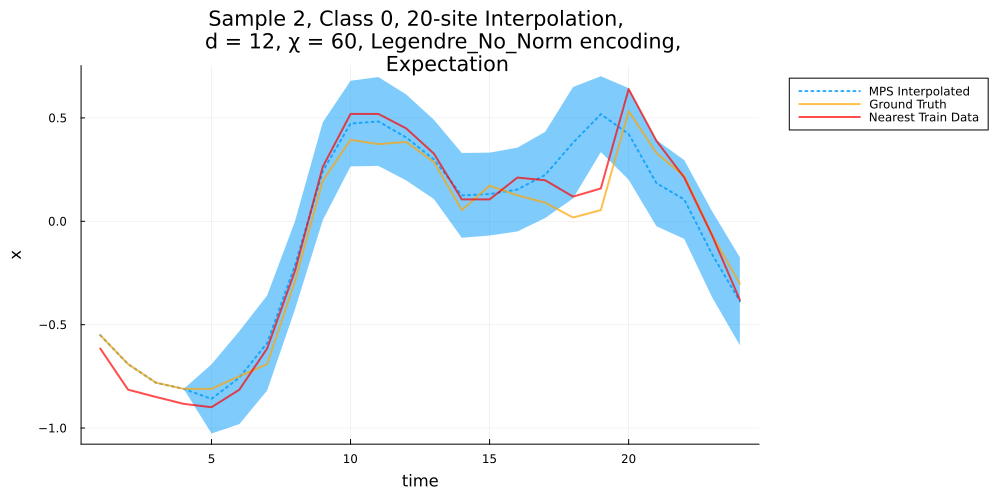

In [24]:
class = 0
interp_sites = collect(5:24)
instance_idx = 2
stats, mse_stats, p1 = any_interpolate_single_time_series(fc, class, instance_idx, interp_sites, :directMean; MSE_baseline=true, X_train_scaled=X_train_scaled, y_train=y_train);

plot(p1)

In [26]:
n1s = sum(y_test)
n0s = length(y_test) - n1s

n_each = 6


samples = [shuffle(1:n0s)[1:n_each]; shuffle(1:n1s)[1:n_each]]
classes = [zeros(Int,n_each); ones(Int,n_each)]

ps = []
stats = []
MSE_stats = []
for (i,s) in enumerate(samples)
    class = classes[i]
    interp_sites = collect(5:24)
    instance_idx = s
    stat, MSE_stat, p1 = any_interpolate_single_time_series(fc, class, instance_idx, interp_sites, :directMean; MSE_baseline=true, X_train_scaled=X_train_scaled, y_train=y_train);
    push!(ps, p1)
    push!(stats, stat)
    push!(MSE_stats, MSE_stat)
end



╭────────┬────────────╮
│ Metric │      Value │
├────────┼────────────┤
│  SMAPE │   0.291173 │
│    MSE │ 0.00562202 │
│   MAPE │   0.617361 │
│    MAE │  0.0627803 │
│   RMSE │ 0.00562202 │
╰────────┴────────────╯
╭────────┬───────────╮
│ Metric │     Value │
├────────┼───────────┤
│  SMAPE │  0.479626 │
│    MSE │ 0.0256286 │
│   MAPE │   1.18757 │
│    MAE │  0.122926 │
│   RMSE │ 0.0256286 │
╰────────┴───────────╯
╭────────┬───────────╮
│ Metric │     Value │
├────────┼───────────┤
│  SMAPE │  0.302356 │
│    MSE │ 0.0113188 │
│   MAPE │  0.275549 │
│    MAE │ 0.0868501 │
│   RMSE │ 0.0113188 │
╰────────┴───────────╯
╭────────┬──────────╮
│ Metric │    Value │
├────────┼──────────┤
│  SMAPE │  1.15416 │
│    MSE │ 0.194132 │
│   MAPE │  1.30013 │
│    MAE │ 0.362098 │
│   RMSE │ 0.194132 │
╰────────┴──────────╯
╭────────┬────────────╮
│ Metric │      Value │
├────────┼────────────┤
│  SMAPE │    0.32187 │
│    MSE │ 0.00484457 │
│   MAPE │   0.595658 │
│    MAE │  0.0556487 │
│   

In [28]:
p1 = plot(ps[1:6]..., size=(2000,1000), layout=(3,2))
savefig(p1, "figs/c0IPD.svg")

p2 = plot(ps[7:12]..., size=(2000,1000), layout=(3,2))
savefig(p2, "figs/c1IPD.svg")

"/home/noodles/Documents/QML Project/QuantumInspiredML/Interpolation/Interp_benchmarks/figs/c1IPD.svg"

p1 = Plot{Plots.GRBackend() n=18}


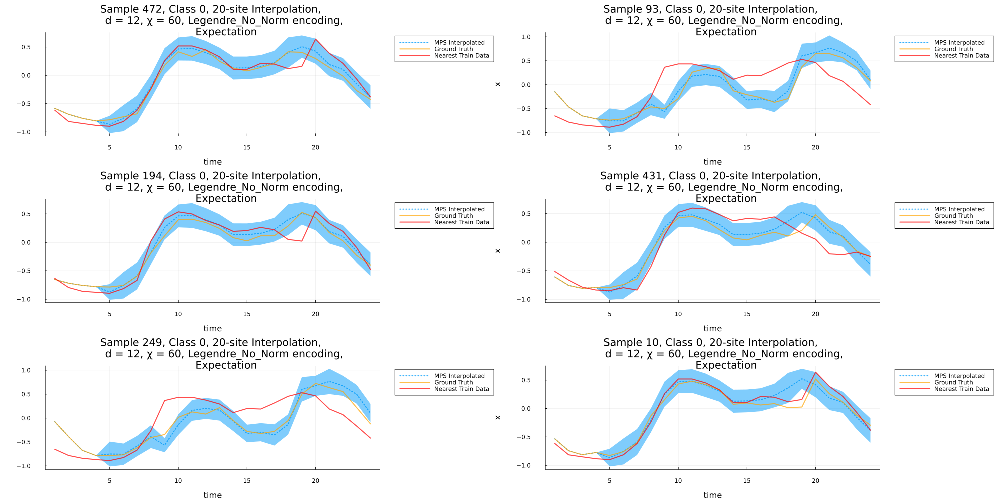

In [29]:
@show p1

In [31]:
n1s = sum(y_test)
n0s = length(y_test) - n1s


samples = [shuffle(1:n0s); shuffle(1:n1s)]
classes = [zeros(Int,n0s); ones(Int,n1s)]

ps = []
stats = []
MSE_stats = []
for (i,s) in enumerate(samples)
    class = classes[i]
    interp_sites = collect(5:24)
    instance_idx = s
    stat, MSE_stat, p1 = any_interpolate_single_time_series(fc, class, instance_idx, interp_sites, :directMean; MSE_baseline=true, X_train_scaled=X_train_scaled, y_train=y_train);
    push!(ps, p1)
    push!(stats, stat)
    push!(MSE_stats, MSE_stat)
end


╭────────┬───────────╮
│ Metric │     Value │
├────────┼───────────┤
│  SMAPE │  0.535208 │
│    MSE │ 0.0378287 │
│   MAPE │  0.628361 │
│    MAE │  0.125537 │
│   RMSE │ 0.0378287 │
╰────────┴───────────╯
╭────────┬───────────╮
│ Metric │     Value │
├────────┼───────────┤
│  SMAPE │  0.857369 │
│    MSE │ 0.0498591 │
│   MAPE │   1.77148 │
│    MAE │  0.176592 │
│   RMSE │ 0.0498591 │
╰────────┴───────────╯
╭────────┬────────────╮
│ Metric │      Value │
├────────┼────────────┤
│  SMAPE │   0.318922 │
│    MSE │ 0.00590807 │
│   MAPE │   0.464736 │
│    MAE │  0.0656982 │
│   RMSE │ 0.00590807 │
╰────────┴────────────╯
╭────────┬───────────╮
│ Metric │     Value │
├────────┼───────────┤
│  SMAPE │  0.786127 │
│    MSE │ 0.0445839 │
│   MAPE │   1.44677 │
│    MAE │   0.16465 │
│   RMSE │ 0.0445839 │
╰────────┴───────────╯
╭────────┬───────────╮
│ Metric │     Value │
├────────┼───────────┤
│  SMAPE │  0.303536 │
│    MSE │ 0.0184258 │
│   MAPE │  0.546921 │
│    MAE │ 0.0835513 │
│ 

Excessive output truncated after 524547 bytes.

In [37]:
stats_df = vcat(DataFrame.(stats)...)
MSE_stats_df = vcat(DataFrame.(MSE_stats)...)

display(describe(stats_df));
println()
display(describe(MSE_stats_df));

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Float64,Float64,Float64,Int64,DataType
1,MAE,0.122969,0.0488828,0.103652,0.586332,0,Float64
2,MAPE,4.26621,0.226335,0.95224,1120.97,0,Float64
3,MSE,0.0339287,0.00344693,0.0195599,0.440471,0,Float64
4,RMSE,0.0339287,0.00344693,0.0195599,0.440471,0,Float64
5,SMAPE,0.543504,0.187882,0.493139,1.54378,0,Float64


Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Float64,Float64,Float64,Int64,DataType
1,MAE,0.208268,0.0620461,0.164854,0.682373,0,Float64
2,MAPE,8.17527,0.291359,1.60611,3663.48,0,Float64
3,MSE,0.0897903,0.00516272,0.047511,0.537538,0,Float64
4,RMSE,0.0897903,0.00516272,0.047511,0.537538,0,Float64
5,SMAPE,0.77328,0.238794,0.686866,1.75554,0,Float64


# Kepler

make_train_test_split_singleTS (generic function with 2 methods)

JLDFile /home/noodles/Documents/QML Project/QuantumInspiredML/Interpolation/paper/NASA_kepler/c6/sample184.jld2 (read-only)
 ├─🔢 X_train
 ├─🔢 y_train
 ├─🔢 X_test
 └─🔢 y_test

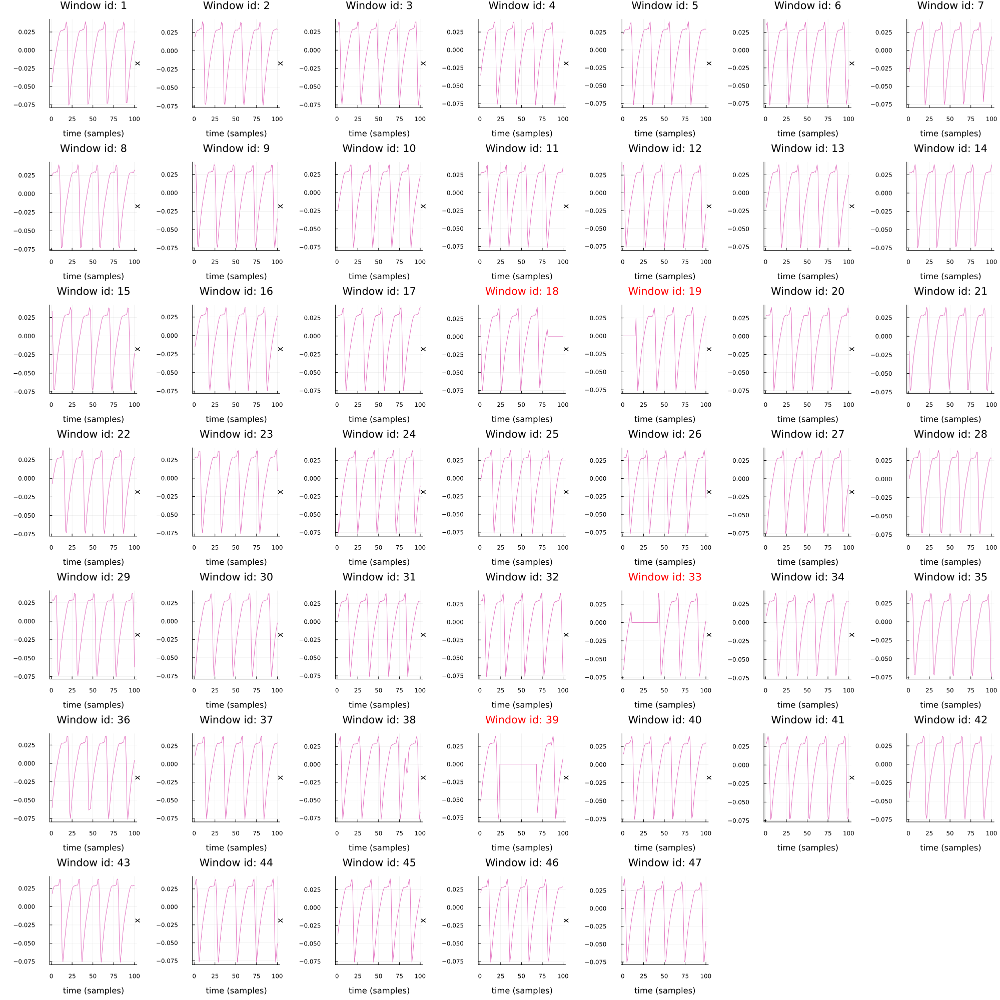

In [52]:
include("../paper/NASA_kepler/KeplerDataProcessor.jl")
all_kepler = load_dataset("../paper/NASA_kepler/datasets/KeplerLightCurves.jld2"); 
w = 100
overlap_fraction = 0.0
window_single_instance(all_kepler, 125, w, overlap_fraction);

In [53]:
discard = [18, 19, 33, 39] ####WHAT#### ?? THe same as 1212
X_train, X_test, y_train, y_test = make_train_test_split_singleTS(all_kepler, 125, discard, overlap_fraction; train_fraction=0.85, return_corrupted_windows=true);

In [2]:
svpath = "../paper/NASA_kepler/mps_saves/legendreNN2_d12_chi35.jld2"
f = jldopen(svpath, "r")
    X_train_scaled = read(f, "X_train_scaled")
    y_train = read(f, "y_train")
    X_test_scaled = read(f, "X_test_scaled")
    y_test = read(f, "y_test");
    mps = read(f, "mps")
    opts = read(f, "opts")
close(f)

fc = load_forecasting_info_variables(mps, X_train_scaled, y_train, X_test_scaled, y_test, opts);

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
                         Summary:

 - Dataset has 36 training samples and 11 testing samples.
 - 1 class(es) was detected. Slicing MPS into individual states...
 - Time independent encoding - Legendre_No_Norm - detected.
 - d = 12, chi_max = 35

 Created 1 forecastable struct(s) containing class-wise mps and test samples.


╭────────┬────────────╮
│ Metric │      Value │
├────────┼────────────┤
│  SMAPE │   0.221379 │
│    MSE │ 0.00899434 │
│   MAPE │    1.02439 │
│    MAE │  0.0770379 │
│   RMSE │ 0.00899434 │
╰────────┴────────────╯
╭────────┬────────────╮
│ Metric │      Value │
├────────┼────────────┤
│  SMAPE │   0.214795 │
│    MSE │ 0.00625452 │
│   MAPE │   0.609613 │
│    MAE │  0.0639437 │
│   RMSE │ 0.00625452 │
╰────────┴────────────╯


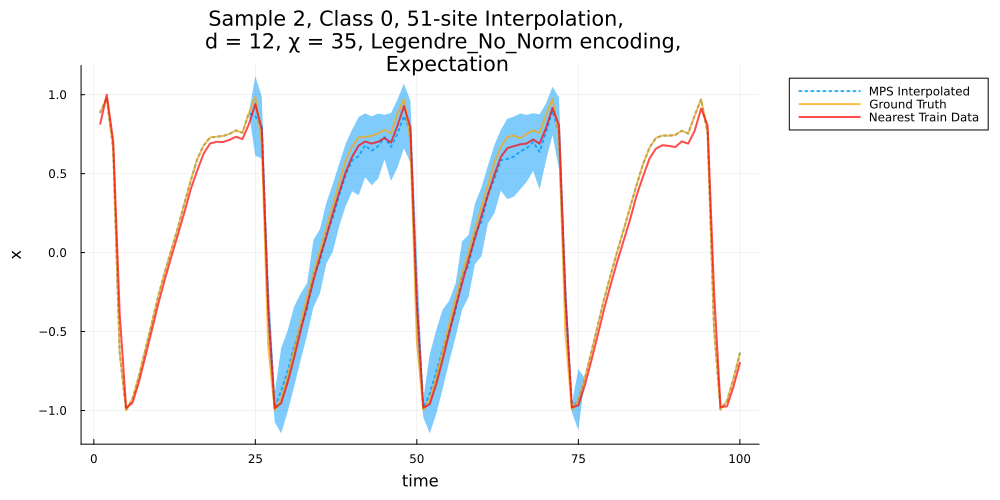

In [4]:
class = 0
interp_sites = collect(25:75)
instance_idx = 2
stats, mse_stats, p1 = any_interpolate_single_time_series(fc, class, instance_idx, interp_sites, :directMean; MSE_baseline=true, X_train_scaled=X_train_scaled, y_train=y_train);

plot(p1)

In [13]:
ns = length(y_test) 


samples = 1:ns
classes = zeros(Int,ns)

ps = []
stats = []
MSE_stats = []
for (i,s) in enumerate(samples)
    class = classes[i]
    interp_sites = collect(25:75)
    instance_idx = s
    stat, MSE_stat, p1 = any_interpolate_single_time_series(fc, class, instance_idx, interp_sites, :directMean; MSE_baseline=true, X_train_scaled=X_train_scaled, y_train=y_train);
    push!(ps, p1)
    push!(stats, stat)
    push!(MSE_stats, MSE_stat)
end

╭────────┬───────────╮
│ Metric │     Value │
├────────┼───────────┤
│  SMAPE │  0.124126 │
│    MSE │  0.005173 │
│   MAPE │   0.13008 │
│    MAE │ 0.0463792 │
│   RMSE │  0.005173 │
╰────────┴───────────╯
╭────────┬────────────╮
│ Metric │      Value │
├────────┼────────────┤
│  SMAPE │   0.122898 │
│    MSE │ 0.00389602 │
│   MAPE │    0.12194 │
│    MAE │  0.0389496 │
│   RMSE │ 0.00389602 │
╰────────┴────────────╯
╭────────┬────────────╮
│ Metric │      Value │
├────────┼────────────┤
│  SMAPE │   0.221379 │
│    MSE │ 0.00899434 │
│   MAPE │    1.02439 │
│    MAE │  0.0770379 │
│   RMSE │ 0.00899434 │
╰────────┴────────────╯
╭────────┬────────────╮
│ Metric │      Value │
├────────┼────────────┤
│  SMAPE │   0.214795 │
│    MSE │ 0.00625452 │
│   MAPE │   0.609613 │
│    MAE │  0.0639437 │
│   RMSE │ 0.00625452 │
╰────────┴────────────╯
╭────────┬───────────╮
│ Metric │     Value │
├────────┼───────────┤
│  SMAPE │  0.329849 │
│    MSE │ 0.0305666 │
│   MAPE │   1.54067 │
│    MA

In [18]:
stats_df = vcat(DataFrame.(stats)...)
MSE_stats_df = vcat(DataFrame.(MSE_stats)...)

display(describe(stats_df));
println()
display(describe(MSE_stats_df));

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Float64,Float64,Float64,Int64,DataType
1,MAE,0.17232,0.0463792,0.0997785,0.472462,0,Float64
2,MAPE,1.45106,0.13008,0.85657,4.93423,0,Float64
3,MSE,0.0866784,0.005173,0.0305666,0.311606,0,Float64
4,RMSE,0.0866784,0.005173,0.0305666,0.311606,0,Float64
5,SMAPE,0.466476,0.124126,0.329849,1.32323,0,Float64


Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Float64,Float64,Float64,Int64,DataType
1,MAE,0.147882,0.0389496,0.100454,0.481143,0,Float64
2,MAPE,1.0792,0.12194,0.609613,4.75027,0,Float64
3,MSE,0.0682483,0.00389602,0.0316879,0.329128,0,Float64
4,RMSE,0.0682483,0.00389602,0.0316879,0.329128,0,Float64
5,SMAPE,0.441887,0.122898,0.328108,1.35596,0,Float64


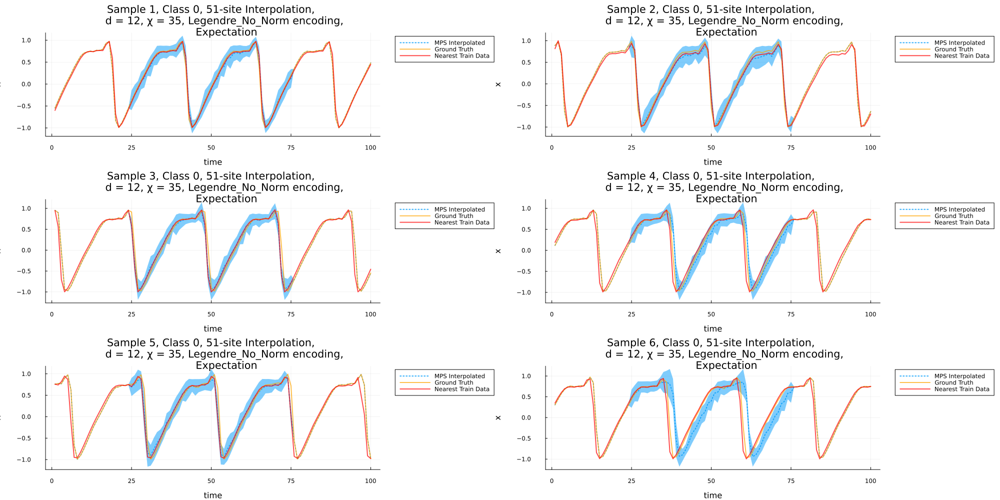

In [19]:
p1 = plot(ps[1:6]..., size=(2000,1000), layout=(3,2))
savefig(p1, "figs/Keps125_1.svg")

p2 = plot(ps[7:11]..., size=(2000,1000), layout=(3,2))
savefig(p2, "figs/Keps125_2.svg")
display(p1)

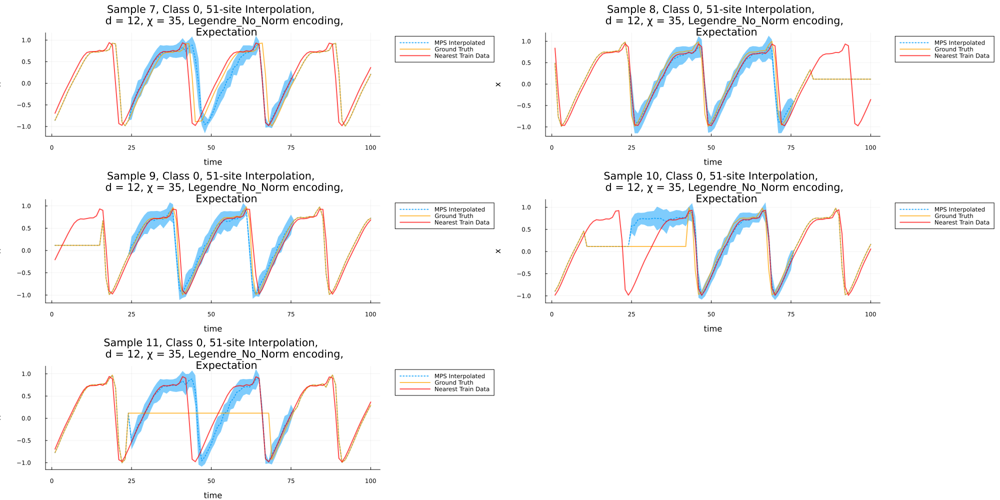

In [20]:
display(p2)

## Direct Mode

In [21]:
ns = length(y_test) 


samples = 1:ns
classes = zeros(Int,ns)

ps = []
stats = []
MSE_stats = []
for (i,s) in enumerate(samples)
    class = classes[i]
    interp_sites = collect(25:75)
    instance_idx = s
    stat, MSE_stat, p1 = any_interpolate_single_time_series(fc, class, instance_idx, interp_sites, :directMode; MSE_baseline=true, X_train_scaled=X_train_scaled, y_train=y_train);
    push!(ps, p1)
    push!(stats, stat)
    push!(MSE_stats, MSE_stat)
end

╭────────┬────────────╮
│ Metric │      Value │
├────────┼────────────┤
│  SMAPE │   0.112773 │
│    MSE │ 0.00386375 │
│   MAPE │    0.11776 │
│    MAE │  0.0369101 │
│   RMSE │ 0.00386375 │
╰────────┴────────────╯
╭────────┬────────────╮
│ Metric │      Value │
├────────┼────────────┤
│  SMAPE │   0.122898 │
│    MSE │ 0.00389602 │
│   MAPE │    0.12194 │
│    MAE │  0.0389496 │
│   RMSE │ 0.00389602 │
╰────────┴────────────╯
╭────────┬────────────╮
│ Metric │      Value │
├────────┼────────────┤
│  SMAPE │    0.20761 │
│    MSE │ 0.00589276 │
│   MAPE │   0.753705 │
│    MAE │  0.0616046 │
│   RMSE │ 0.00589276 │
╰────────┴────────────╯
╭────────┬────────────╮
│ Metric │      Value │
├────────┼────────────┤
│  SMAPE │   0.214795 │
│    MSE │ 0.00625452 │
│   MAPE │   0.609613 │
│    MAE │  0.0639437 │
│   RMSE │ 0.00625452 │
╰────────┴────────────╯
╭────────┬──────────╮
│ Metric │    Value │
├────────┼──────────┤
│  SMAPE │ 0.328747 │
│    MSE │ 0.031749 │
│   MAPE │  1.70996 │
│   

In [22]:
stats_df = vcat(DataFrame.(stats)...)
MSE_stats_df = vcat(DataFrame.(MSE_stats)...)

display(describe(stats_df));
println()
display(describe(MSE_stats_df));

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Float64,Float64,Float64,Int64,DataType
1,MAE,0.167084,0.0369101,0.0950802,0.531815,0,Float64
2,MAPE,1.21102,0.11776,0.702195,4.883,0,Float64
3,MSE,0.0972973,0.00386375,0.0287664,0.453579,0,Float64
4,RMSE,0.0972973,0.00386375,0.0287664,0.453579,0,Float64
5,SMAPE,0.448309,0.112773,0.280492,1.34618,0,Float64


Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Float64,Float64,Float64,Int64,DataType
1,MAE,0.147882,0.0389496,0.100454,0.481143,0,Float64
2,MAPE,1.0792,0.12194,0.609613,4.75027,0,Float64
3,MSE,0.0682483,0.00389602,0.0316879,0.329128,0,Float64
4,RMSE,0.0682483,0.00389602,0.0316879,0.329128,0,Float64
5,SMAPE,0.441887,0.122898,0.328108,1.35596,0,Float64


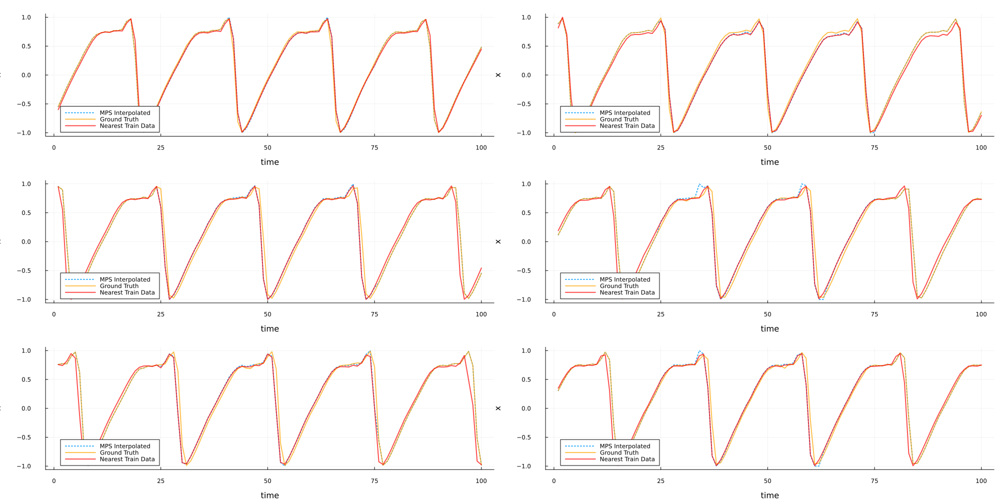

In [23]:
p1 = plot(ps[1:6]..., size=(2000,1000), layout=(3,2))
savefig(p1, "figs/Keps125_1_mode.svg")

p2 = plot(ps[7:11]..., size=(2000,1000), layout=(3,2))
savefig(p2, "figs/Keps125_2_mode.svg")
display(p1)

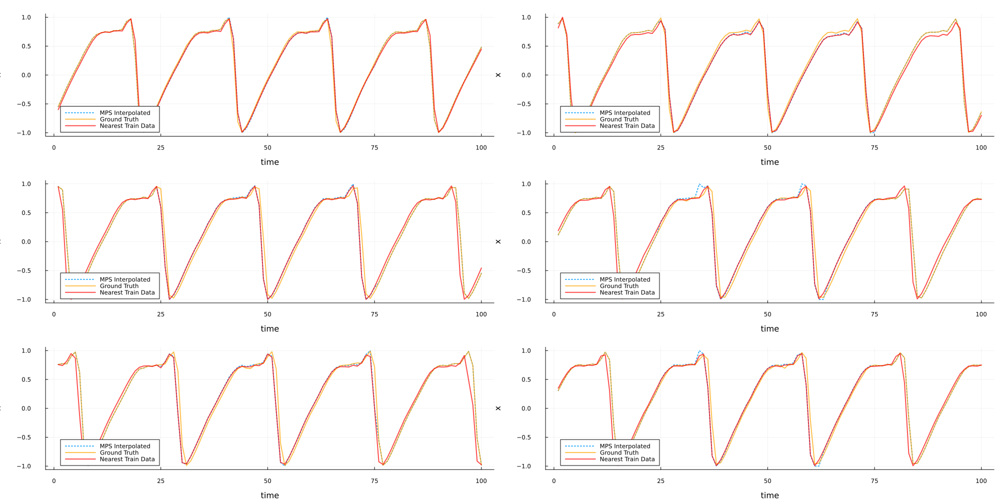

In [24]:
display(p1)

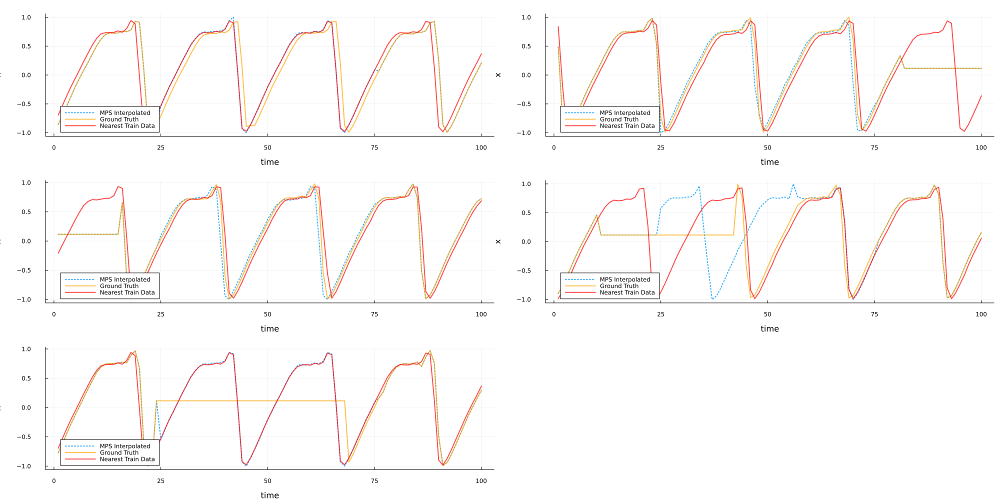

In [25]:
display(p2)

# Kepler 564

In [44]:

f = jldopen("../paper/NASA_kepler/mps_saves/legendreNN_s564_d12_chi34.jld2")
X_train_scaled = read(f, "X_train_scaled")
y_train = read(f, "y_train")
X_test_scaled = read(f, "X_test_scaled")
y_test = read(f, "y_test");
mps = read(f, "mps")
opts = read(f, "opts")
close(f)

fc = load_forecasting_info_variables(mps, X_train_scaled, y_train, X_test_scaled, y_test, opts);

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
                         Summary:

 - Dataset has 21 training samples and 26 testing samples.
 - 1 class(es) was detected. Slicing MPS into individual states...
 - Time independent encoding - Legendre_No_Norm - detected.
 - d = 12, chi_max = 34

 Created 1 forecastable struct(s) containing class-wise mps and test samples.


╭────────┬──────────╮
│ Metric │    Value │
├────────┼──────────┤
│  SMAPE │  1.77815 │
│    MSE │ 0.448161 │
│   MAPE │  1.14395 │
│    MAE │ 0.586258 │
│   RMSE │ 0.448161 │
╰────────┴──────────╯
╭────────┬──────────╮
│ Metric │    Value │
├────────┼──────────┤
│  SMAPE │ 0.747952 │
│    MSE │ 0.135092 │
│   MAPE │  1.31667 │
│    MAE │ 0.302063 │
│   RMSE │ 0.135092 │
╰────────┴──────────╯


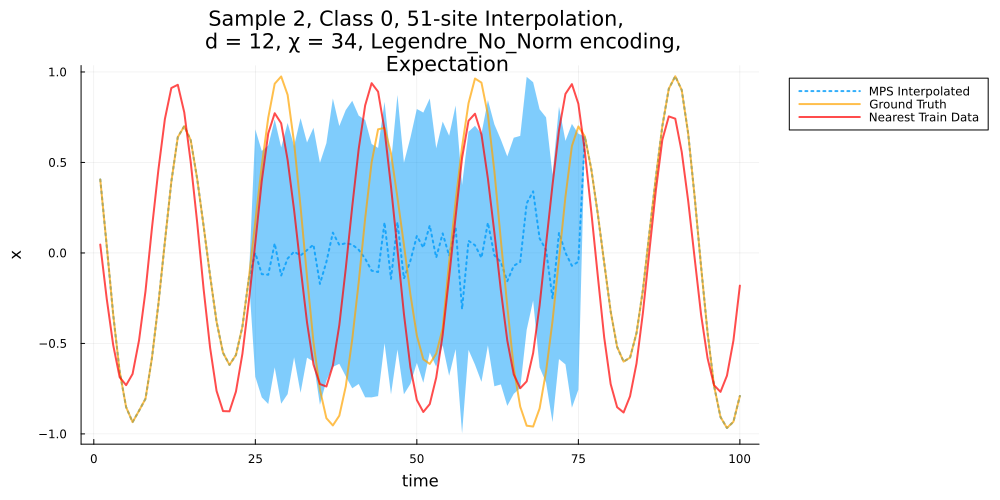

In [45]:
class = 0
interp_sites = collect(25:75)
instance_idx = 2
stats, mse_stats, p1 = any_interpolate_single_time_series(fc, class, instance_idx, interp_sites, :directMean; MSE_baseline=true, X_train_scaled=X_train_scaled, y_train=y_train);

plot(p1)

In [46]:
ns = length(y_test) 


samples = 1:ns
classes = zeros(Int,ns)

ps = []
stats = []
MSE_stats = []
for (i,s) in enumerate(samples)
    class = classes[i]
    interp_sites = collect(25:75)
    instance_idx = s
    stat, MSE_stat, p1 = any_interpolate_single_time_series(fc, class, instance_idx, interp_sites, :directMean; MSE_baseline=true, X_train_scaled=X_train_scaled, y_train=y_train);
    push!(ps, p1)
    push!(stats, stat)
    push!(MSE_stats, MSE_stat)
end

╭────────┬────────────╮
│ Metric │      Value │
├────────┼────────────┤
│  SMAPE │   0.222376 │
│    MSE │ 0.00494075 │
│   MAPE │   0.811902 │
│    MAE │  0.0603681 │
│   RMSE │ 0.00494075 │
╰────────┴────────────╯
╭────────┬────────────╮
│ Metric │      Value │
├────────┼────────────┤
│  SMAPE │   0.186248 │
│    MSE │ 0.00342999 │
│   MAPE │   0.631029 │
│    MAE │  0.0462833 │
│   RMSE │ 0.00342999 │
╰────────┴────────────╯
╭────────┬──────────╮
│ Metric │    Value │
├────────┼──────────┤
│  SMAPE │  1.77815 │
│    MSE │ 0.448161 │
│   MAPE │  1.14395 │
│    MAE │ 0.586258 │
│   RMSE │ 0.448161 │
╰────────┴──────────╯
╭────────┬──────────╮
│ Metric │    Value │
├────────┼──────────┤
│  SMAPE │ 0.747952 │
│    MSE │ 0.135092 │
│   MAPE │  1.31667 │
│    MAE │ 0.302063 │
│   RMSE │ 0.135092 │
╰────────┴──────────╯
╭────────┬───────────╮
│ Metric │     Value │
├────────┼───────────┤
│  SMAPE │  0.343085 │
│    MSE │ 0.0114093 │
│   MAPE │  0.456537 │
│    MAE │ 0.0936167 │
│   RMSE │ 

In [47]:
stats_df = vcat(DataFrame.(stats)...)
MSE_stats_df = vcat(DataFrame.(MSE_stats)...)

display(describe(stats_df));
println()
display(describe(MSE_stats_df));

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Float64,Float64,Float64,Int64,DataType
1,MAE,0.217501,0.0574605,0.113854,0.586258,0,Float64
2,MAPE,7.03645,0.288472,1.09401,106.671,0,Float64
3,MSE,0.103051,0.00494075,0.0174776,0.448161,0,Float64
4,RMSE,0.103051,0.00494075,0.0174776,0.448161,0,Float64
5,SMAPE,0.69571,0.222376,0.394725,1.80708,0,Float64


Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Float64,Float64,Float64,Int64,DataType
1,MAE,0.171684,0.0462833,0.13347,0.517761,0,Float64
2,MAPE,8.60129,0.283754,0.945156,129.724,0,Float64
3,MSE,0.0585071,0.00342999,0.0226979,0.364049,0,Float64
4,RMSE,0.0585071,0.00342999,0.0226979,0.364049,0,Float64
5,SMAPE,0.542485,0.186248,0.471602,1.77636,0,Float64


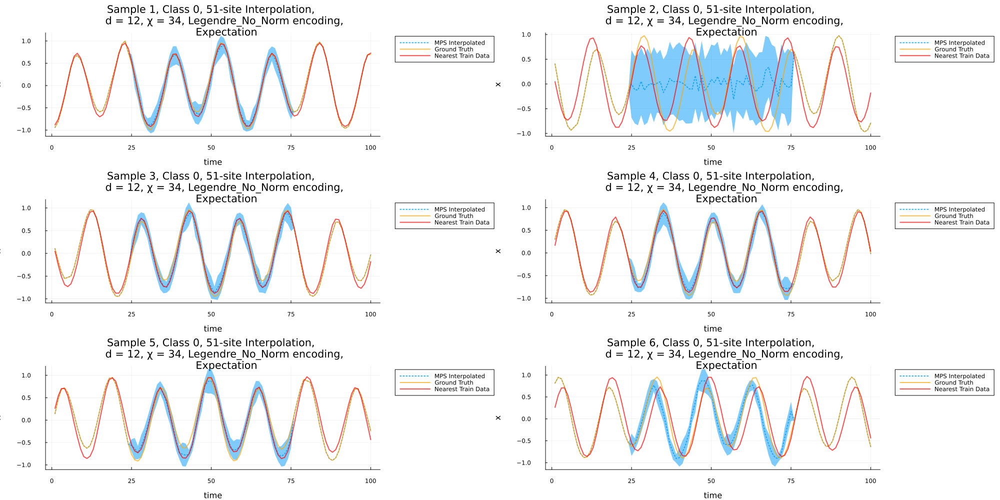

In [53]:
p1 = plot(ps[1:6]..., size=(2000,1000), layout=(3,2))
savefig(p1, "figs/Keps564_1.svg")

p2 = plot(ps[end-5:end]..., size=(2000,1000), layout=(3,2))
savefig(p2, "figs/Keps564_2.svg")
display(p1)

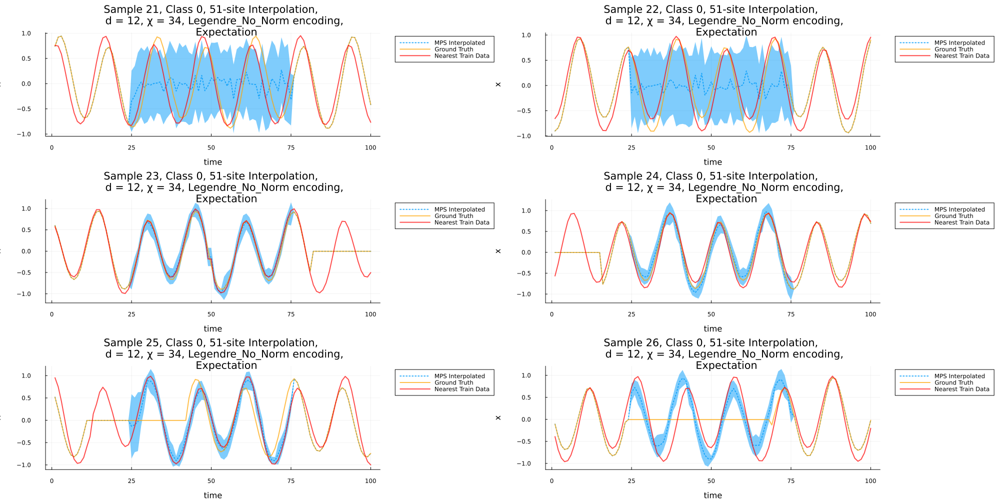

In [54]:
display(p2)